Importing packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MultipleLocator
from palettable.colorbrewer.qualitative import Pastel1_7
import squarify

Reading datasets

In [2]:
#Reading csv file
df_world= pd.read_csv('chinese debt trap all over the world.csv')
df_africa= pd.read_csv('chinese debt trap in Africa (sector wise).csv')

In [3]:
# Info of dataset df_world and df_africa
df_world.info()
print('======='*18)
print('======='*18)
df_africa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Expand All | Collapse All    858 non-null    object
 1   YEAR                         858 non-null    int64 
 2   AMOUNT                       858 non-null    object
 3   LENDER                       858 non-null    object
 4   BORROWER                     857 non-null    object
 5   SECTOR                       858 non-null    object
 6   SENSITIVE TERRITORY OVERLAP  858 non-null    object
 7   Country                      858 non-null    object
dtypes: int64(1), object(7)
memory usage: 53.8+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1188 entries, 0 to 1187
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   S.no          1188 non-null   int64 
 1   Project       1188 non-null   object
 

In [4]:
df_world.head()

,Expand All | Collapse All,YEAR,AMOUNT,LENDER,BORROWER,SECTOR,SENSITIVE TERRITORY OVERLAP,Country
0,"“Lar Patriota"" Infrastructure (Phase 1)",2011,$50M,CDB,Government,Transport,None Known,Angola
1,"10-Year Oil Supply Plan (10Mt/Year), ""Oil for ...",2009,$7.0B,CDB,Petrobras,"Extraction, pipelines",None Known,Brazil
2,1000 housing project,2012,$47M,ExImBank,Government,Government,None Known,Suriname
3,115kV Transmission Line and Substation from Ph...,2009,$475M,ExImBank,Electricite Du Cambodge,Power,None Known,Cambodia
4,151 Multisector infrastructure projects,2016,$600M,CDB,Central Bank of Kenya,Mulit-sector/discretionary,None Known,Kenya


In [5]:
df_africa.head()

,S.no,Project,Year,Lender,$ Allocation,Country,Invested On
0,1,"Luanda Railway Phase I Rehabilitation, 444km (...",2002,CHEXIM,$90M,Angola,Transportation
1,2,"Kipsigak-Serem-Shamakhokho Road, 54km, Loan 2",2001,CIDCA,$6M,Kenya,Transportation
2,3,"Addis-Adama Expressway Phase I, 80km",2009,CHEXIM,$349M,Ethiopia,Transportation
3,4,"Railway Modernisation Project 1 (Idu-Kaduna), ...",2010,CHEXIM,$500M,Nigeria,Transportation
4,5,Special Train Loan - TAZARA,2001,CIDCA,$6M,Zambia,Transportation


In [6]:
df_africa['Invested On'].unique()

array(['Transportation', 'Power', 'Mining', 'ICT', 'Water',
       'Other social', 'Multisector', 'Industry', 'Defense', 'Government',
       'Banking', 'Unallocated', 'Agriculture', 'Budget', 'Education',
       'Business', 'Health', 'Trade', 'Other commodity', 'Food',
       'Environment'], dtype=object)

In [7]:
#checking if dataset df_world contains NAN values or not
print (df_world.isna().sum())
#checking for duplicated rows
df_world.duplicated().sum()

Expand All | Collapse All      0
YEAR                           0
AMOUNT                         0
LENDER                         0
BORROWER                       1
SECTOR                         0
SENSITIVE TERRITORY OVERLAP    0
Country                        0
dtype: int64


0

In [8]:
# checking for NA in df_africa dataset
print(df_africa.isna().sum())
# checking for duplicates in df_africa dataset
df_africa.duplicated().sum()

S.no            0
Project         0
Year            0
Lender          0
$ Allocation    0
Country         0
Invested On     0
dtype: int64


0

In [9]:
#Removing NA column 
df_world.dropna(inplace=True)

In [10]:
df_world.rename(columns={'Expand All | Collapse All':'PROJECT'}, inplace= True)

In [11]:
df_world.head()

,PROJECT,YEAR,AMOUNT,LENDER,BORROWER,SECTOR,SENSITIVE TERRITORY OVERLAP,Country
0,"“Lar Patriota"" Infrastructure (Phase 1)",2011,$50M,CDB,Government,Transport,None Known,Angola
1,"10-Year Oil Supply Plan (10Mt/Year), ""Oil for ...",2009,$7.0B,CDB,Petrobras,"Extraction, pipelines",None Known,Brazil
2,1000 housing project,2012,$47M,ExImBank,Government,Government,None Known,Suriname
3,115kV Transmission Line and Substation from Ph...,2009,$475M,ExImBank,Electricite Du Cambodge,Power,None Known,Cambodia
4,151 Multisector infrastructure projects,2016,$600M,CDB,Central Bank of Kenya,Mulit-sector/discretionary,None Known,Kenya


In [12]:
amount= []
for i in df_world['AMOUNT']:
    i = i.replace('$', '')
    if i[-1]== 'B':
        amount.append(float(i.replace('B',''))*1000)
    else:
        i =i.replace('M','')
        amount.append(float(i.replace('M','')))
df_world['AMOUNT']= amount
df_world.head()

,PROJECT,YEAR,AMOUNT,LENDER,BORROWER,SECTOR,SENSITIVE TERRITORY OVERLAP,Country
0,"“Lar Patriota"" Infrastructure (Phase 1)",2011,50.0,CDB,Government,Transport,None Known,Angola
1,"10-Year Oil Supply Plan (10Mt/Year), ""Oil for ...",2009,7000.0,CDB,Petrobras,"Extraction, pipelines",None Known,Brazil
2,1000 housing project,2012,47.0,ExImBank,Government,Government,None Known,Suriname
3,115kV Transmission Line and Substation from Ph...,2009,475.0,ExImBank,Electricite Du Cambodge,Power,None Known,Cambodia
4,151 Multisector infrastructure projects,2016,600.0,CDB,Central Bank of Kenya,Mulit-sector/discretionary,None Known,Kenya


In [13]:
df_world['LENDER'].unique()

array(['CDB', 'ExImBank', 'CDB, ExImBank', 'BOC, CDB, ExImBank',
       'CDB, ICBC', 'CDB, others', 'CDB, Citic'], dtype=object)

In [14]:
df_world['BORROWER'].nunique()

120

In [15]:
df_world['SENSITIVE TERRITORY OVERLAP'].unique()

array(['None Known',
       "Within Indigenous Peoples' Lands\n Within Critical Habitats",
       "Within Indigenous Peoples' Lands",
       "Within Indigenous Peoples' Lands\n Within National Protected Areas",
       'Within Critical Habitats\n Within National Protected Areas',
       'Within Critical Habitats',
       "Within Indigenous Peoples' Lands\n Within Critical Habitats\n Within National Protected Areas",
       'Within National Protected Areas'], dtype=object)

In [16]:
df_world['SENSITIVE TERRITORY OVERLAP'].replace({"Within Indigenous Peoples' Lands\n Within Critical Habitats":"Within Indigenous Peoples' Lands and Critical Habitats",
                                                "Within Indigenous Peoples' Lands\n Within National Protected Areas":"Within Indigenous Peoples' Lands and National Protected Areas",
                                                 'Within Critical Habitats\n Within National Protected Areas':'Within Critical Habitats and National Protected Areas',
                                                 "Within Indigenous Peoples' Lands\n Within Critical Habitats\n Within National Protected Areas":"Within Indigenous Peoples' Lands and Critical Habitats and National Protected Areas"
                                                }, inplace= True)

In [17]:
df_world['SENSITIVE TERRITORY OVERLAP'].unique()

array(['None Known',
       "Within Indigenous Peoples' Lands and Critical Habitats",
       "Within Indigenous Peoples' Lands",
       "Within Indigenous Peoples' Lands and National Protected Areas",
       'Within Critical Habitats and National Protected Areas',
       'Within Critical Habitats',
       "Within Indigenous Peoples' Lands and Critical Habitats and National Protected Areas",
       'Within National Protected Areas'], dtype=object)

In [18]:
df_world['SECTOR'].unique()

array(['Transport', 'Extraction, pipelines', 'Government', 'Power',
       'Mulit-sector/discretionary', 'Telecom', 'Other construction',
       'Agriculture, food', 'Manufacturing', 'fTransport'], dtype=object)

In [19]:
df_world['SECTOR'].replace({'fTransport':'Transport'}, inplace=True)

In [20]:
#import re
#for df in [df_world]:
 #   column_name_snake_case=[]
  #  for i in df.columns.values:
   #     column_name_snake_case.append(re.sub('([A-z])', r'([A-z])[/_]', i).upper())
 #   df.columns=column_name_snake_case
#df_world.head()

In [21]:
df_world[['LENDER','AMOUNT']].groupby(by='LENDER').sum().reset_index().sort_values(by= 'AMOUNT',ascending=True)

,LENDER,AMOUNT
2,"CDB, Citic",273.0
0,"BOC, CDB, ExImBank",690.0
4,"CDB, ICBC",3300.0
5,"CDB, others",10000.0
3,"CDB, ExImBank",11950.0
6,ExImBank,202309.0
1,CDB,233625.0


In [22]:
#Year 2008 total loan amount and times taken by countries

COUNTRY_AMOUNT_2008=df_world[df_world['YEAR']== 2008][['AMOUNT','Country']].groupby(by= 'Country').sum().sort_values(by= 'AMOUNT',ascending=False).reset_index()
COUNTRY_COUNT_2008= df_world[df_world['YEAR']== 2008][['Country']].groupby(by= 'Country').value_counts().reset_index()
COUNTRY_COUNT_2008.rename(columns={0:'Count'}, inplace=True)
count_amount_2008= COUNTRY_AMOUNT_2008.merge(COUNTRY_COUNT_2008, on='Country')
count_amount_2008

,Country,AMOUNT,Count
0,Kazakhstan,1300.0,1
1,Indonesia,1023.0,3
2,"Congo, Democratic Republic of the",791.0,7
3,Vietnam,557.0,1
4,Pakistan,527.0,2
5,Morocco,515.0,1
6,Brazil,356.0,1
7,Gabon,318.0,1
8,Zambia,316.0,1
9,Angola,275.0,5


In [23]:
##Year 2008 total loan amount and times taken for different categories
SECTOR_AMOUNT_2008=df_world[df_world['YEAR']== 2008][['AMOUNT','SECTOR']].groupby(by= 'SECTOR').sum().sort_values(by= 'AMOUNT',ascending=False).reset_index()
SECTOR_COUNT_2008= df_world[df_world['YEAR']== 2008][['SECTOR']].groupby(by= 'SECTOR').value_counts().reset_index()
SECTOR_COUNT_2008.rename(columns={0:'Count'}, inplace=True)
sector_count_amount_2008= SECTOR_AMOUNT_2008.merge(SECTOR_COUNT_2008, on='SECTOR')
sector_count_amount_2008['label']= sector_count_amount_2008['SECTOR']+' ( '+ sector_count_amount_2008['AMOUNT'].astype(int).astype(str)+' M )'
sector_count_amount_2008

,SECTOR,AMOUNT,Count,label
0,Power,3398.0,15,Power ( 3398 M )
1,Manufacturing,1300.0,1,Manufacturing ( 1300 M )
2,Transport,1226.0,11,Transport ( 1226 M )
3,Mulit-sector/discretionary,565.0,2,Mulit-sector/discretionary ( 565 M )
4,"Extraction, pipelines",429.0,1,"Extraction, pipelines ( 429 M )"
5,Telecom,342.0,4,Telecom ( 342 M )
6,Government,224.0,4,Government ( 224 M )
7,Other construction,52.0,1,Other construction ( 52 M )
8,"Agriculture, food",29.0,1,"Agriculture, food ( 29 M )"


In [24]:
##Year 2008 total loan amount and times taken from LENDER
BANK_AMOUNT_2008=df_world[df_world['YEAR']== 2008][['AMOUNT','LENDER']].groupby(by= 'LENDER').sum().sort_values(by= 'AMOUNT',ascending=False).reset_index()
BANK_COUNT_2008= df_world[df_world['YEAR']== 2008][['LENDER']].groupby(by= 'LENDER').value_counts().reset_index()
BANK_COUNT_2008.rename(columns={0:'Count'}, inplace=True)
bank_count_amount_2008= BANK_AMOUNT_2008.merge(BANK_COUNT_2008, on='LENDER')
bank_count_amount_2008

,LENDER,AMOUNT,Count
0,ExImBank,6174.0,34
1,CDB,1391.0,6


In [25]:
plt.rcParams['figure.dpi'] = 800
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(24,20), facecolor='#f6f5f5')
gs = fig.add_gridspec(2, 2)
gs.update(wspace=0.05, hspace=0.2)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0])
#ax2 = fig.add_subplot(gs[0, 1])
#ax3 = fig.add_subplot(gs[1, 1])
ax4 = fig.add_subplot(gs[0, 1])
ax5 = fig.add_subplot(gs[1, 1])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
    ax1.spines[s].set_visible(False)
    #ax2.spines[s].set_visible(False)
    #ax3.spines[s].set_visible(False)


ax0.set_facecolor(background_color)
ax1.set_facecolor(background_color)
#ax2.set_facecolor(background_color)
#ax3.set_facecolor(background_color)

#barchart countries
ax0_sns = count_amount_2008.plot(x='Country',y='AMOUNT',kind='bar',ax=ax0,color='red',zorder=2,width=0.8) ##plotttt
ax1_sns = count_amount_2008.plot(x='Country',y='Count',kind='bar',ax=ax1,zorder=2,width=0.8) ##plotttt

#treemap:
squarify.plot(sizes=sector_count_amount_2008['AMOUNT'], label=sector_count_amount_2008['label'], alpha=.8 , ax= ax5, color=Pastel1_7.hex_colors,text_kwargs={'fontsize': 9})

#pie chart               

ax4_sns= sector_count_amount_2008.groupby(['SECTOR']).sum().plot(kind='pie', y='Count', ax= ax4,autopct='%1.0f%%',startangle=240, textprops={'fontsize': 9}, pctdistance= 0.8,labeldistance=1.1,colors=Pastel1_7.hex_colors, legend=None)

#barchart lenders

#ax2_sns = bank_count_amount_2008.plot(x='LENDER',y='AMOUNT',kind='bar',ax=ax2,color='red',zorder=2,width=0.4) ##plotttt
#ax3_sns = bank_count_amount_2008.plot(x='LENDER',y='Count',kind='bar',ax=ax3,zorder=2,width=0.4) ##plotttt


#Labels, titles, grids, legends:
ax0_sns.set_ylabel('Total Amount',fontsize=10, weight='bold')
ax0_sns.set_xlabel('',fontsize=10, weight='bold')
ax1_sns.set_xlabel('Country',fontsize=10, weight='bold',)
ax1_sns.set_ylabel('Times taken',fontsize=10, weight='bold')
#ax2_sns.set_ylabel('Total Amount',fontsize=10, weight='bold')
#ax2_sns.set_xlabel('',fontsize=10, weight='bold')
#ax3_sns.set_xlabel('Lender',fontsize=10, weight='bold',)
#ax3_sns.set_ylabel('Times taken',fontsize=10, weight='bold')

ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax1_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax1_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)

#ax2_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
#ax2_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
#ax3_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
#ax3_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)

ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=10, bbox_to_anchor=(1, 1.01), loc='lower right')
ax1_sns.legend(['Times taken'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=10, bbox_to_anchor=(1, 1.01), loc='lower right')

#ax2_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=8, bbox_to_anchor=(1, 1.01), loc='lower right')
#ax3_sns.legend(['Times taken'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=8, bbox_to_anchor=(1, 1.01), loc='lower right')

ax0_sns.tick_params(labelsize=8, width=0.5, length=1.5)
#ax1_sns.tick_params(labelsize=8, width=0.5, length=1.5)
ax0_sns.xaxis.set_ticklabels([])
#ax2_sns.xaxis.set_ticklabels([])
#ax4_sns.tick_params(labelsize=8, width=0.5, length=1.5)
#ax5_sns.tick_params(labelsize=8, width=0.5, length=1.5)

#ax0.title.set_text('My Plot Title', fontsize= 4)
ax0.set_title('Total loan amount taken by countries',pad=40, fontsize=13, weight= 'bold')
ax1.set_title('Total times taken by countries',pad=40, fontsize=13, weight= 'bold')
#ax2.set_title('Total loan amount given by lenders',pad=40, fontsize=13, weight= 'bold')
#ax3.set_title('Total times taken from lenders',pad=75, fontsize=13, weight= 'bold')
ax4.set_title('Total times loan given on various sectors ',pad=40, fontsize=13, weight= 'bold')
ax5.set_title('Total loan given on various sectors by amount',pad=40, fontsize=13, weight= 'bold')
plt.suptitle(" Year 2008 overview",y=0.98, fontsize=16, ha='center')
#plt.title("Entries between Year and Total Amount", fontsize=4 , ha='center')

ax4.axis('off')
ax5.axis('off')

for p in ax0_sns.patches:
            value = f'{p.get_height():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x()
                y = p.get_y() + p.get_height()  + 80
                value_Str= value + ' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=6, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

for q in ax1_sns.patches:
            value = f'{q.get_height():.0f}'
            if value == '0':
                pass
            else:
                x = q.get_x()+ p.get_width()/3
                y = p.get_y() + q.get_height()+ 0.25
                value_Str= value 
                ax1.text(x, y, value_Str, ha='right', va='center', fontsize=6, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))


plt.show()

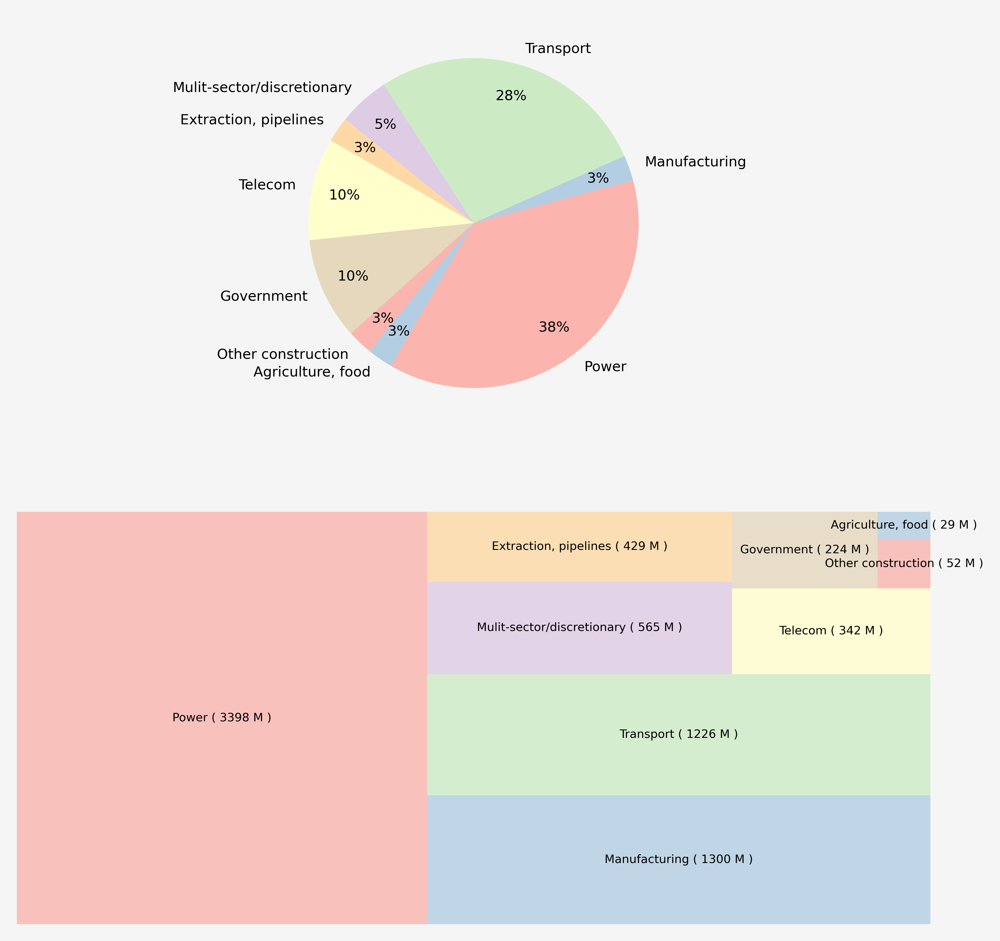

In [26]:

plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
#sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(7,7), facecolor='#f6f5f5')
gs = fig.add_gridspec(2, 1)
gs.update(wspace=0, hspace=0.2)

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0])
for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
   
    
ax0.set_facecolor(background_color)
ax1.set_facecolor(background_color)


ax0_sns= ax0.pie(sector_count_amount_2008['Count'], labels=sector_count_amount_2008['SECTOR'],autopct='%1.0f%%',startangle=240, textprops={'fontsize': 6}, pctdistance= 0.8,labeldistance=1.1,colors=Pastel1_7.hex_colors)

#ax0_sns= sector_count_amount_2008.groupby(['SECTOR']).sum().plot(kind='pie', y='Count', ax= ax0,autopct='%1.0f%%',startangle=240, textprops={'fontsize': 6}, pctdistance= 0.8,labeldistance=1.1,colors=Pastel1_7.hex_colors, legend=None)
#plt.legend(sector_count_amount_2008['SECTOR'], loc="upper right", fontsize=3, bbox_to_anchor=(1, 1.01))
squarify.plot(sizes=sector_count_amount_2008['AMOUNT'], label=sector_count_amount_2008['label'], alpha=.8 , ax= ax1, color=Pastel1_7.hex_colors,text_kwargs={'fontsize': 5})
ax0.axis('off')
ax1.axis('off')

plt.show()


In [27]:
#################################

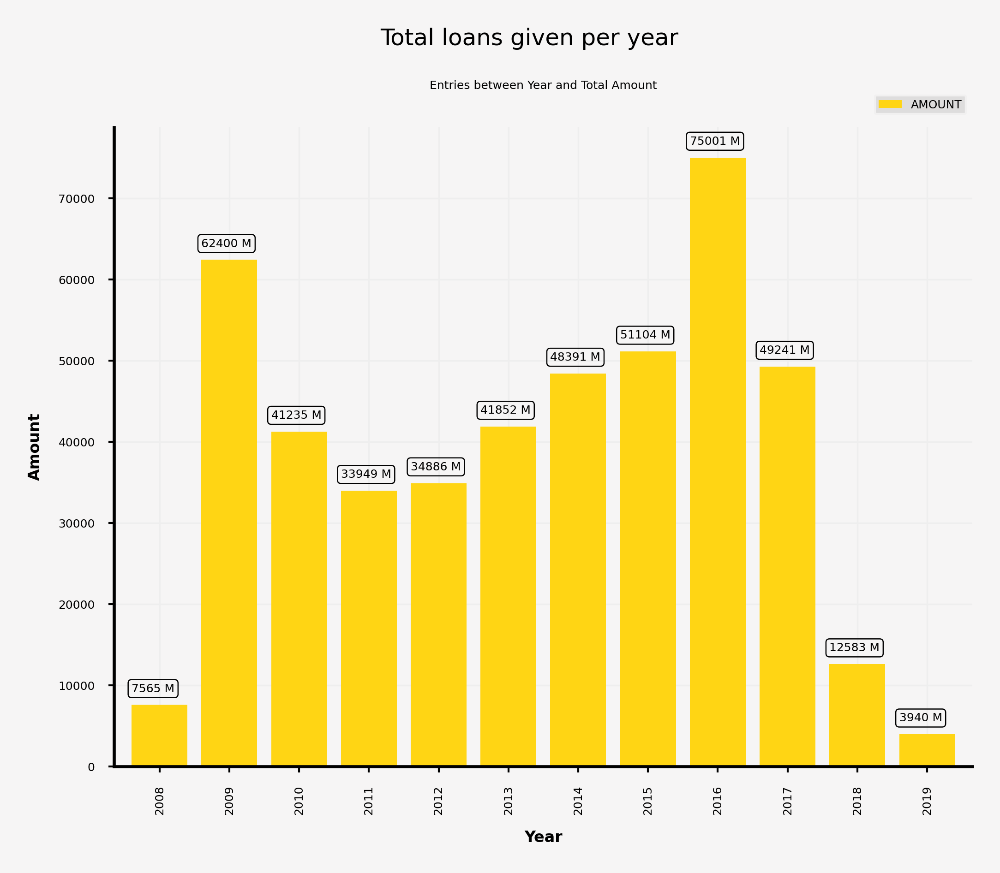

In [83]:

plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)


data_YEAR_lender_amount= df_world[['YEAR','AMOUNT']].groupby(by='YEAR').sum().reset_index()
ax0_sns = data_YEAR_lender_amount.plot(x='YEAR',y='AMOUNT',kind='bar',ax=ax0,zorder=2,width=0.8) ##plotttt
ax0_sns.set_xlabel('Year',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Amount',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.01), loc='lower right')


ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)

plt.suptitle("Total loans given per year",y=1, fontsize=6, ha='center')
plt.title("Entries between Year and Total Amount",pad=10, fontsize=3 , ha='center')

for p in ax0_sns.patches:
            value = f'{p.get_height():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x()
                y = p.get_y() + p.get_height()  + 2000
                value_Str= value + ' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

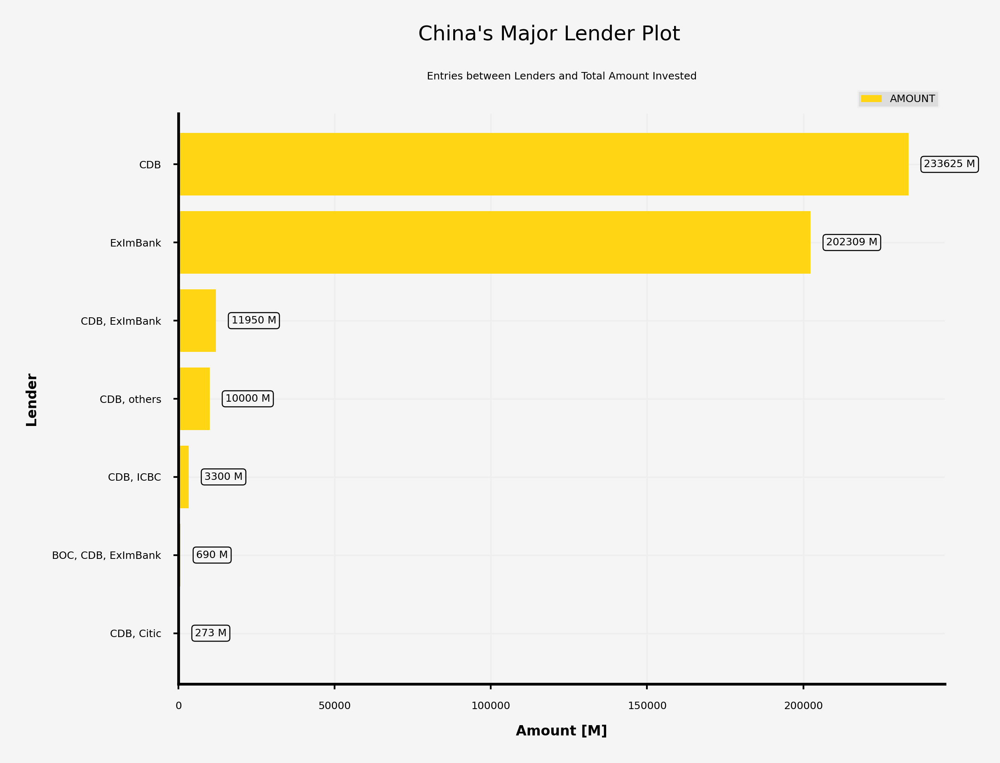

In [74]:
plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=1.5, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)
data_lender_amount= df_world[['LENDER','AMOUNT']].groupby(by='LENDER').sum().reset_index().sort_values(by= 'AMOUNT',ascending=True)
ax0_sns = data_lender_amount.plot(x='LENDER',y='AMOUNT',kind='barh',ax=ax0,zorder=2,width=0.8) ##plotttt
ax0_sns.set_xlabel('Amount [M]',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Lender',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.05), loc='upper right')

ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)
plt.suptitle("China's Major Lender Plot",y=1, fontsize=6,)
plt.title('Entries between Lenders and Total Amount Invested',pad=10, fontsize=3)
# ax0_sns.text(86400,7.5, f" China's Majour Lender Plot", fontsize=6, weight='bold',ha='right')
# ax0.text(152000,7,f'Entries by Lenders and Total Amount Invested',fontsize=3,ha='right')
for p in ax0_sns.patches:
            value = f'{p.get_width():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x() + p.get_width() + 5000
                y = p.get_y() + p.get_height() / 2 
                value_Str= value+' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

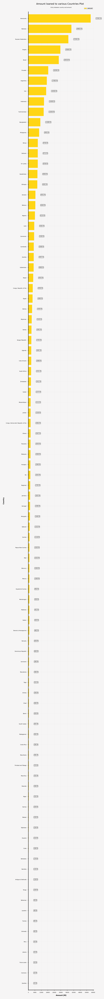

In [77]:

plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(3,45), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)

data_countries_amount= df_world[['Country','AMOUNT']].groupby(by='Country').sum().reset_index().sort_values(by= 'AMOUNT',ascending=True)

ax0_sns = data_countries_amount.plot(x='Country',y='AMOUNT',kind='barh',ax=ax0,zorder=2,width=0.8) ##plotttt
ax0_sns.set_xlabel('Amount [M]',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Country',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.005), loc='upper right')

ax0_sns.xaxis.set_major_locator(MultipleLocator(6000))
ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)
#ax0_sns.set_title('Country Plot', fontsize=6, weight='bold', pad=20)
plt.suptitle('Amount loaned to various Countries Plot',y=0.887, fontsize=6,)
plt.title('Entry between country and amount',pad=10, fontsize=3)
#ax0_sns.text(200,94.5,f'Country Plot', fontsize=6, weight='bold', va='top', ha='right')
#ax0.text(100,7,f'Entries by Countries and Total Amount spent',fontsize=3,ha='right')
for p in ax0_sns.patches:
            value = f'{p.get_width():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x() + p.get_width() + 5000
                y = p.get_y() + p.get_height() / 2 
                value_Str= value+' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

In [31]:
Nepal_data= df_world[df_world['Country']== 'Nepal']
Nepal_data
Nepal_sector= Nepal_data[['SECTOR','AMOUNT']].groupby(by='SECTOR').sum().reset_index().sort_values(by='AMOUNT', ascending= True)
Nepal_borrower= Nepal_data[['BORROWER','AMOUNT']].groupby(by='BORROWER').sum().reset_index().sort_values(by='AMOUNT', ascending= True)
Nepal_year_data= Nepal_data[['YEAR','AMOUNT']].groupby(by='YEAR').sum().reset_index().sort_values(by= 'YEAR',ascending=True)
#df_world[['Country','AMOUNT']].groupby(by='Country').sum().reset_index().sort_values(by= 'AMOUNT',ascending=True)

In [32]:
Nepal_data

,PROJECT,YEAR,AMOUNT,LENDER,BORROWER,SECTOR,SENSITIVE TERRITORY OVERLAP,Country
103,Budhigandaki Hydroelectric Project,2017,2500.0,ExImBank,Government,Power,Within Indigenous Peoples' Lands,Nepal
449,MA 60 and Y12 air crafts purchase,2016,35.0,ExImBank,Nepal Airline Corporation,Transport,None Known,Nepal
614,Pokhara International Airport,2016,216.0,ExImBank,Government,Transport,Within Indigenous Peoples' Lands and Critical ...,Nepal
797,Trishuli-3A project,2011,152.0,ExImBank,Nepal Electricity Authority,Power,Within Indigenous Peoples' Lands and Critical ...,Nepal
811,Upper Trishuli III Dam,2011,200.0,ExImBank,Government,Power,Within Indigenous Peoples' Lands and Critical ...,Nepal
842,West Seti Hydropower Project (Chinese Covering...,2015,1400.0,ExImBank,Nepal Electricity Authority,Power,Within Indigenous Peoples' Lands,Nepal


In [33]:
Nepal_borrower

,BORROWER,AMOUNT
1,Nepal Airline Corporation,35.0
2,Nepal Electricity Authority,1552.0
0,Government,2916.0


In [34]:
Nepal_sector

,SECTOR,AMOUNT
1,Transport,251.0
0,Power,4252.0


In [35]:
Nepal_year_data

,YEAR,AMOUNT
0,2011,352.0
1,2015,1400.0
2,2016,251.0
3,2017,2500.0


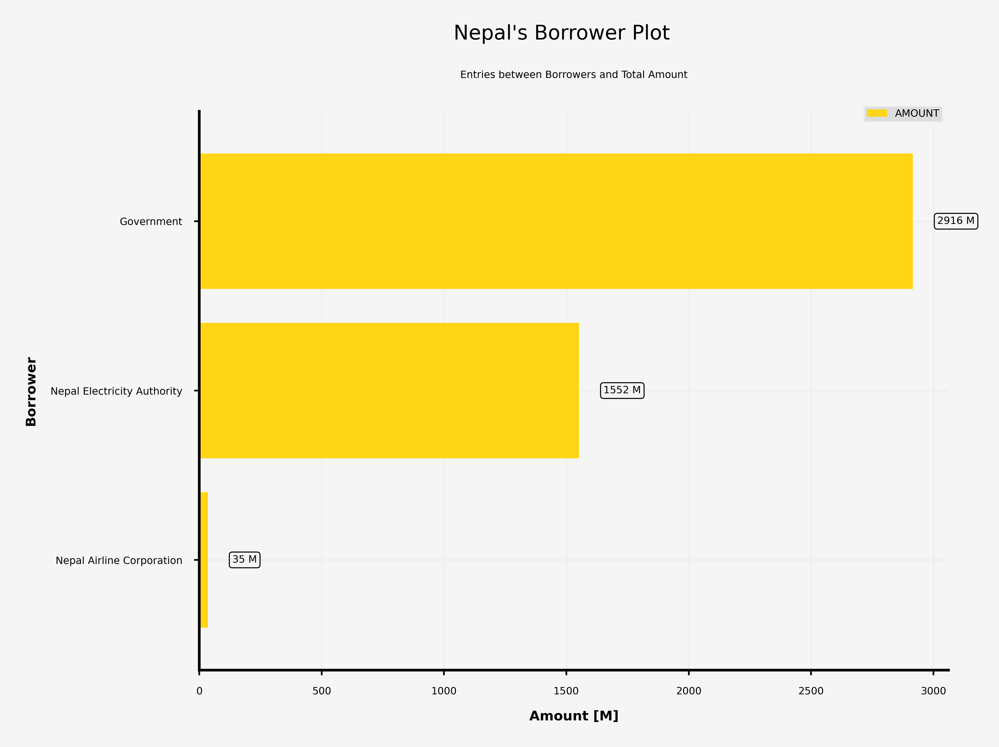

In [80]:
from matplotlib.ticker import MultipleLocator
plt.rcParams['figure.dpi'] = 900
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)



ax0_sns = Nepal_borrower.plot(x='BORROWER',y='AMOUNT',kind='barh',ax=ax0,zorder=2,width=0.8) ##plotttt
ax0_sns.set_xlabel('Amount [M]',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Borrower',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.02), loc='upper right')

# ax0_sns.xaxis.set_major_locator(MultipleLocator(6000))
ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)
#ax0_sns.set_title('Country Plot', fontsize=6, weight='bold', pad=20)
plt.suptitle("Nepal's Borrower Plot",y=1, fontsize=6, ha='center')
plt.title("Entries between Borrowers and Total Amount",pad=10, fontsize=3 , ha='center')
#ax0_sns.text(200,94.5,f'Country Plot', fontsize=6, weight='bold', va='top', ha='right')
#ax0.text(100,7,f'Entries by Countries and Total Amount spent',fontsize=3,ha='right')
for p in ax0_sns.patches:
            value = f'{p.get_width():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x() + p.get_width() + 100
                y = p.get_y() + p.get_height() / 2 
                value_Str= value + ' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

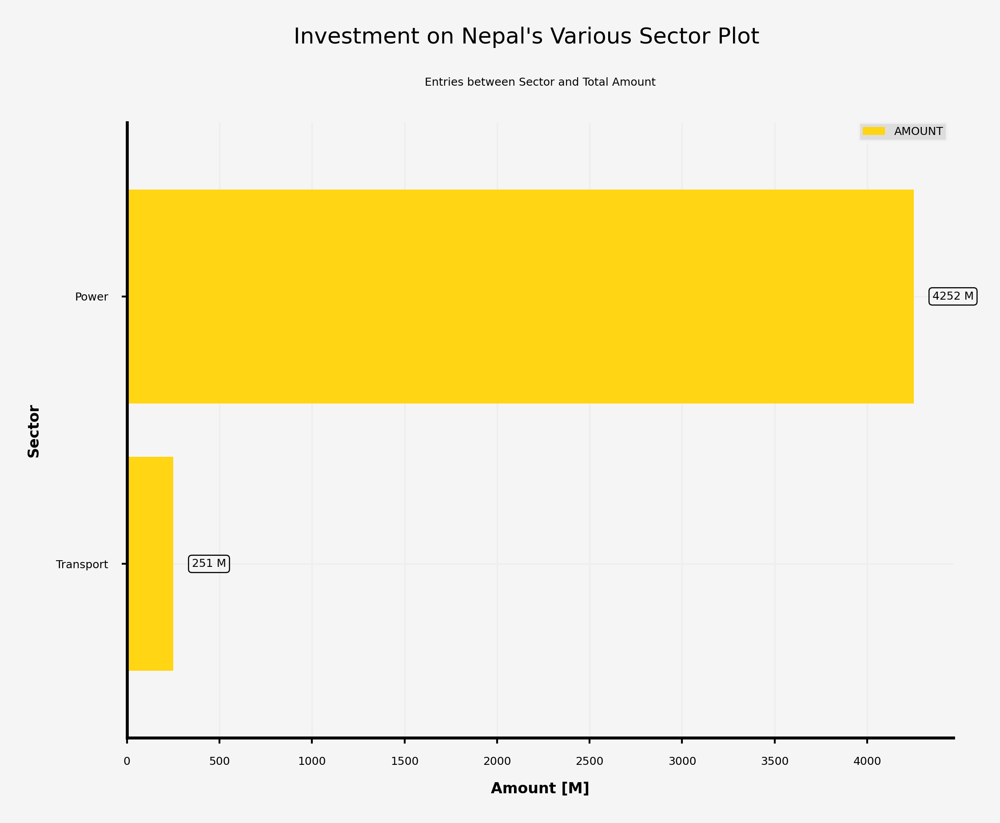

In [81]:
from matplotlib.ticker import MultipleLocator
plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)



ax0_sns = Nepal_sector.plot(x='SECTOR',y='AMOUNT',kind='barh',ax=ax0,zorder=2,width=0.8) ##plotttt
ax0_sns.set_xlabel('Amount [M]',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Sector',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.01), loc='upper right')

#ax0_sns.xaxis.set_major_locator(MultipleLocator(6000))
ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)
#ax0_sns.set_title('Country Plot', fontsize=6, weight='bold', pad=20)
plt.suptitle("Investment on Nepal's Various Sector Plot",y=1, fontsize=6, ha='center')
plt.title("Entries between Sector and Total Amount",pad=10, fontsize=3 , ha='center')
#ax0_sns.text(200,94.5,f'Country Plot', fontsize=6, weight='bold', va='top', ha='right')
#ax0.text(100,7,f'Entries by Countries and Total Amount spent',fontsize=3,ha='right')
for p in ax0_sns.patches:
            value = f'{p.get_width():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x() + p.get_width() + 100
                y = p.get_y() + p.get_height() / 2 
                value_Str= value + ' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

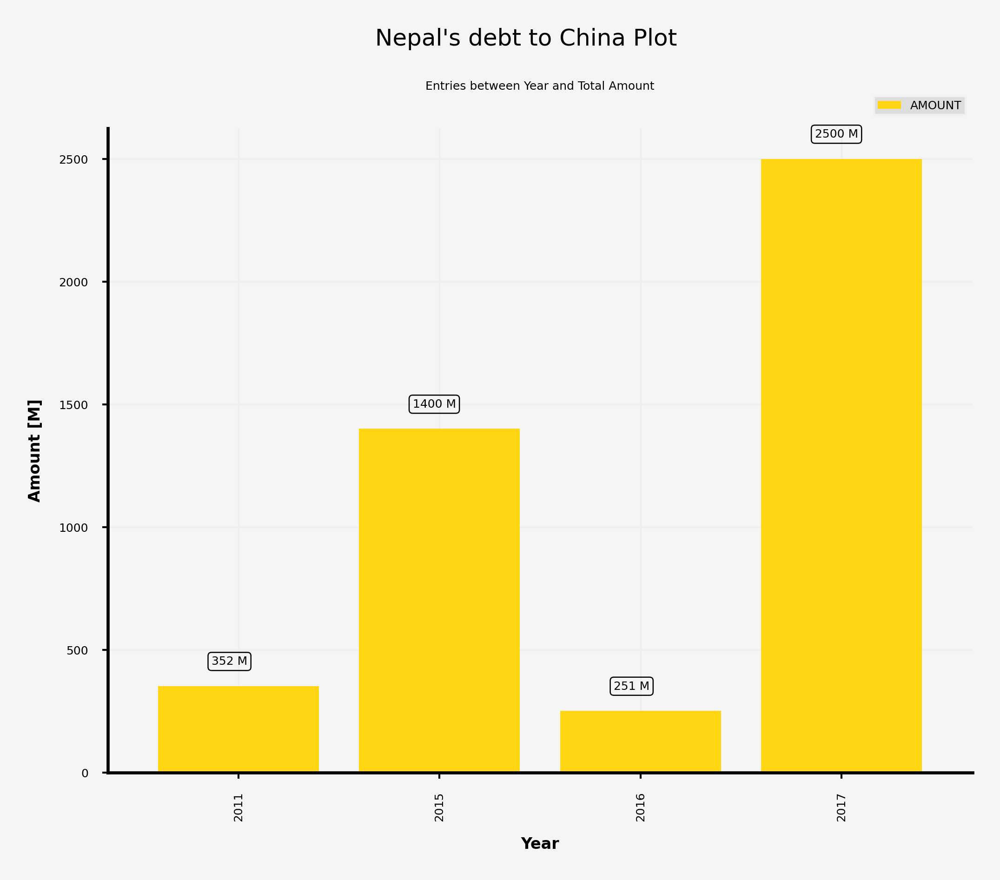

In [82]:
from matplotlib.ticker import MultipleLocator
plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)



ax0_sns = Nepal_year_data.plot(x='YEAR',y='AMOUNT',kind='bar',ax=ax0,zorder=2,width=0.8) ##plotttt
ax0_sns.set_xlabel('Year',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Amount [M]',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.01), loc='lower right')

#ax0_sns.xaxis.set_major_locator(MultipleLocator(6000))
ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)
#ax0_sns.set_title('Country Plot', fontsize=6, weight='bold', pad=20)
plt.suptitle("Nepal's debt to China Plot",y=1, fontsize=6, ha='center')
plt.title("Entries between Year and Total Amount",pad=10, fontsize=3 , ha='center')
#ax0_sns.text(200,94.5,f'Country Plot', fontsize=6, weight='bold', va='top', ha='right')
#ax0.text(100,7,f'Entries by Countries and Total Amount spent',fontsize=3,ha='right')
for p in ax0_sns.patches:
            value = f'{p.get_height():.0f}'
            if value == '0':
                pass
            else:
                x = p.get_x()+ p.get_width()/3 
                y = p.get_y() + p.get_height()  + 100
                value_Str= value + ' M'
                ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

In [39]:
#china's investment over years (amount loaned vs years)

In [40]:
invest_over_years= df_world[['YEAR','AMOUNT']].groupby(by='YEAR').sum().reset_index()
invest_over_years


,YEAR,AMOUNT
0,2008,7565.0
1,2009,62400.0
2,2010,41235.0
3,2011,33949.0
4,2012,34886.0
5,2013,41852.0
6,2014,48391.0
7,2015,51104.0
8,2016,75001.0
9,2017,49241.0


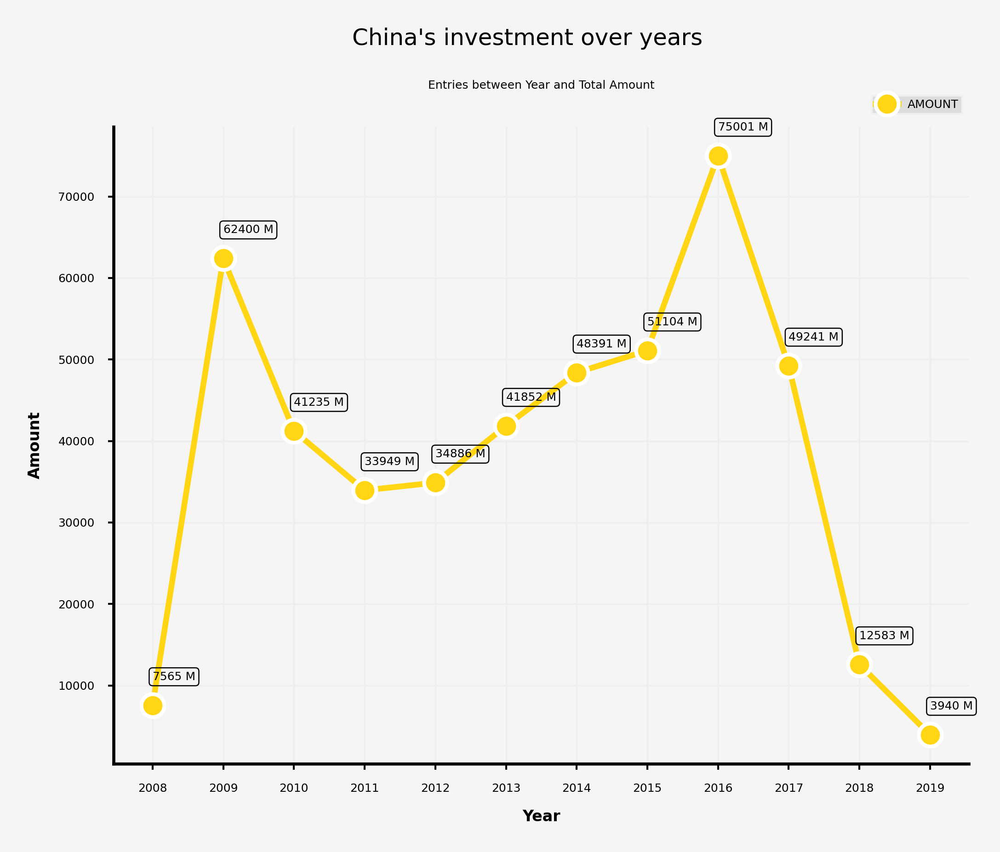

In [41]:

plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)



ax0_sns = invest_over_years.plot(x='YEAR',y='AMOUNT',kind='line',ax=ax0,zorder=2, marker= 'o', mec= 'white') ##plotttt
ax0_sns.set_xlabel('Year',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Amount',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['AMOUNT'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.01), loc='lower right')
ax0_sns.xaxis.set_major_locator(MultipleLocator(1))
ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)

plt.suptitle("China's investment over years",y=1, fontsize=6, ha='center')
plt.title("Entries between Year and Total Amount",pad=10, fontsize=3 , ha='center')

for i, j in zip(invest_over_years.YEAR, invest_over_years.AMOUNT):
    x = i
    y = j  + 3500
    value_Str= str(int(j)) + ' M'
    ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

In [42]:
invest_over_years_category= df_world[['YEAR','AMOUNT','SECTOR']].groupby(by=['YEAR','SECTOR']).sum().reset_index()
invest_over_years_category.head()

,YEAR,SECTOR,AMOUNT
0,2008,"Agriculture, food",29.0
1,2008,"Extraction, pipelines",429.0
2,2008,Government,224.0
3,2008,Manufacturing,1300.0
4,2008,Mulit-sector/discretionary,565.0


In [43]:
pivot_data= invest_over_years_category.pivot(index='YEAR',columns='SECTOR', values= 'AMOUNT')
pivot_data.fillna(0, inplace=True)
pivot_data.reset_index(inplace= True)
pivot_data.rename_axis(None, axis=1, inplace=True)

In [44]:
pivot_data

,YEAR,"Agriculture, food","Extraction, pipelines",Government,Manufacturing,Mulit-sector/discretionary,Other construction,Power,Telecom,Transport
0,2008,29.0,429.0,224.0,1300.0,565.0,52.0,3398.0,342.0,1226.0
1,2009,30.0,43060.0,599.0,326.0,150.0,162.0,14328.0,451.0,3294.0
2,2010,0.0,0.0,855.0,1142.0,20360.0,118.0,5131.0,912.0,12717.0
3,2011,487.0,14203.0,1462.0,3513.0,206.0,0.0,8385.0,668.0,5025.0
4,2012,3579.0,2200.0,3855.0,0.0,4192.0,3143.0,9620.0,301.0,7996.0
5,2013,745.0,14650.0,1997.0,0.0,5270.0,0.0,8267.0,697.0,10226.0
6,2014,886.0,5000.0,774.0,300.0,4000.0,892.0,13115.0,812.0,22612.0
7,2015,1600.0,8209.0,3791.0,966.0,12096.0,170.0,9082.0,1184.0,14006.0
8,2016,170.0,20742.0,3003.0,0.0,4498.0,16774.0,7740.0,395.0,21679.0
9,2017,0.0,5694.0,3054.0,1200.0,7715.0,1233.0,11726.0,1782.0,16837.0


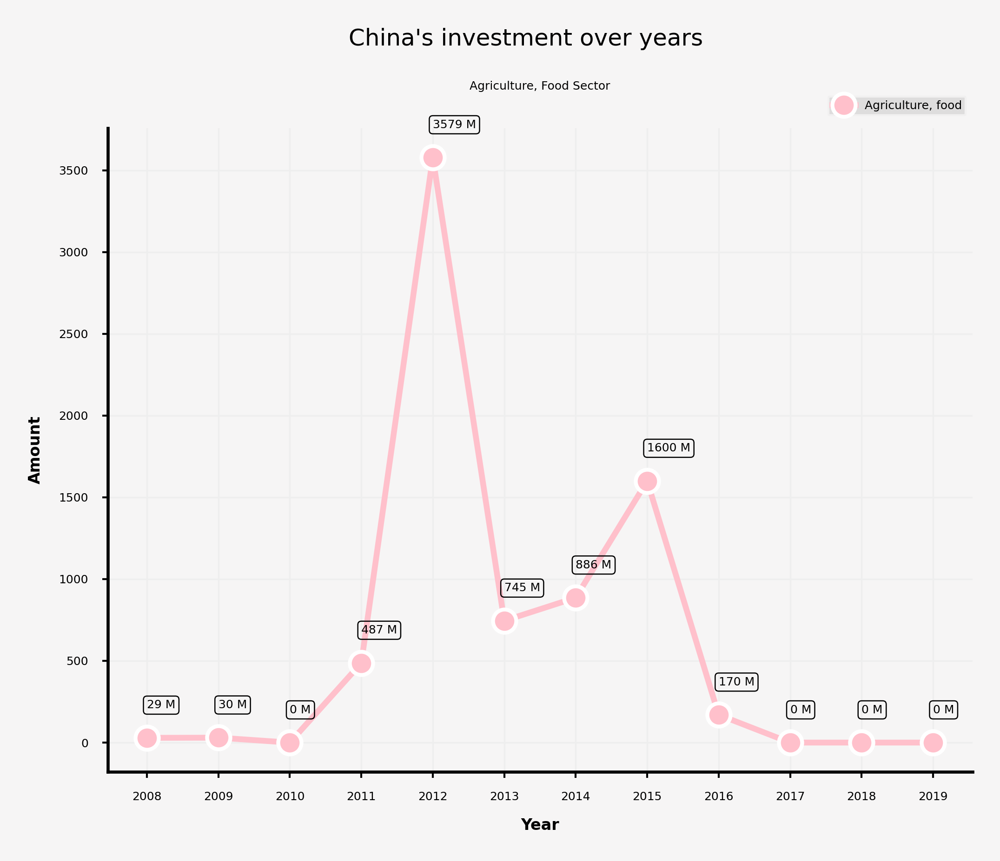

In [45]:

plt.rcParams['figure.dpi'] = 600
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(4,3), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0.05)
ax0 = fig.add_subplot(gs[0, 0])

for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
ax0.set_facecolor(background_color)



ax0_sns = pivot_data.plot(x='YEAR',y='Agriculture, food',kind='line',ax=ax0,zorder=2, marker= 'o',c='pink', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Extraction, pipelines',kind='line',ax=ax0,zorder=2,c='red', marker= 'o', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Government',kind='line',ax=ax0,zorder=2,c='green', marker= 'o', mec= 'white') ##plotttt

#ax0_sns = pivot_data.plot(x='YEAR',y='Manufacturing',kind='line',ax=ax0,zorder=2,c='blue', marker= 'o', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Mulit-sector/discretionary',kind='line',ax=ax0,zorder=2,c='black', marker= 'o', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Power',kind='line',ax=ax0,zorder=2,c='orange', marker= 'o', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Telecom',kind='line',ax=ax0,zorder=2,c='purple', marker= 'o', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Transport',kind='line',ax=ax0,zorder=2,c='pink', marker= 'o', mec= 'white') ##plotttt
#ax0_sns = pivot_data.plot(x='YEAR',y='Other construction',kind='line',ax=ax0,zorder=2,c='white', marker= 'o', mec= 'white') ##plotttt

ax0_sns.set_xlabel('Year',fontsize=4, weight='bold',)
ax0_sns.set_ylabel('Amount',fontsize=4, weight='bold')
ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax0_sns.legend(['Agriculture, food'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.01), loc='lower right')

ax0_sns.xaxis.set_major_locator(MultipleLocator(1))
ax0_sns.yaxis.set_major_locator(MultipleLocator(500))

ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)

plt.suptitle("China's investment over years",y=1, fontsize=6, ha='center')
plt.title("Agriculture, Food Sector",pad=10, fontsize=3 , ha='center')

for i, j in zip(pivot_data.YEAR, pivot_data['Agriculture, food']):
    x = i
    y = j  + 200
    value_Str= str(int(j)) + ' M'
    ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

In [48]:
plt.rcParams['figure.dpi'] = 1000
background_color = "#f6f5f5"
sns.set_palette(['#FFD514']*1200)
fig = plt.figure(figsize=(12,12), facecolor='#f6f5f5')
gs = fig.add_gridspec(3, 3)
gs.update(wspace=0.1, hspace=0.2)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[1, 1])
ax5 = fig.add_subplot(gs[1, 2])
ax6 = fig.add_subplot(gs[2, 0])
ax7 = fig.add_subplot(gs[2, 1])
ax8 = fig.add_subplot(gs[2, 2])
for i in [ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]:
    for s in ["right", "top"]:
        i.spines[s].set_visible(False)
        i.set_facecolor(background_color)
    
#ax0.set_facecolor(background_color)



ax0_sns = pivot_data.plot(x='YEAR',y='Agriculture, food',kind='line',ax=ax0,zorder=2, marker= 'o',c='pink', mec= 'white') ##plotttt
ax1_sns = pivot_data.plot(x='YEAR',y='Extraction, pipelines',kind='line',ax=ax1,zorder=2,c='red', marker= 'o', mec= 'white') ##plotttt
ax2_sns = pivot_data.plot(x='YEAR',y='Government',kind='line',ax=ax2,zorder=2,c='green', marker= 'o', mec= 'white') ##plotttt
ax3_sns = pivot_data.plot(x='YEAR',y='Manufacturing',kind='line',ax=ax3,zorder=2,c='coral', marker= 'o', mec= 'white') ##plotttt
ax4_sns = pivot_data.plot(x='YEAR',y='Mulit-sector/discretionary',kind='line',ax=ax4,zorder=2,c='lime', marker= 'o', mec= 'white') ##plotttt
ax5_sns = pivot_data.plot(x='YEAR',y='Other construction',kind='line',ax=ax5,zorder=2,c='violet', marker= 'o', mec= 'white') ##plotttt
ax6_sns = pivot_data.plot(x='YEAR',y='Power',kind='line',ax=ax6,zorder=2,c='orange', marker= 'o', mec= 'white') ##plotttt
ax7_sns = pivot_data.plot(x='YEAR',y='Telecom',kind='line',ax=ax7,zorder=2,c='cyan', marker= 'o', mec= 'white') ##plotttt
ax8_sns = pivot_data.plot(x='YEAR',y='Transport',kind='line',ax=ax8,zorder=2,c='pink', marker= 'o', mec= 'white') ##plotttt


#ax0_sns.set_xlabel('Year',fontsize=4, weight='bold',)
#ax0_sns.set_ylabel('Amount',fontsize=4, weight='bold')
#ax0_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
#ax0_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
#ax0_sns.legend(['Agriculture, food'], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=3, bbox_to_anchor=(1, 1.01), loc='lower right')

for i,j in zip([ax0_sns,ax1_sns,ax2_sns,ax3_sns,ax4_sns,ax5_sns,ax6_sns,ax7_sns,ax8_sns],pivot_data.columns[1:]):
    i.set_xlabel('',fontsize=4, weight='bold',)
    #i.set_ylabel('Amount',fontsize=4, weight='bold')
    i.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
    i.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
    i.legend([j], ncol=1, facecolor='#D8D8D8', edgecolor=background_color, fontsize=5, bbox_to_anchor=(1, 1.01), loc='lower right')
    i.tick_params(labelsize=3, width=0.5, length=1.5)

ax0_sns.xaxis.set_major_locator(MultipleLocator(1))
ax0_sns.yaxis.set_major_locator(MultipleLocator(500))

#ax0_sns.tick_params(labelsize=3, width=0.5, length=1.5)

plt.suptitle("China's investment in various sectors over years",y=0.95, fontsize=6, ha='center')


for k,axis in zip(pivot_data.columns[1:],[ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]):
    for i, j in zip(pivot_data.YEAR, pivot_data[k]):
        x = i
        y = (j  + 200) if j < 200 else (j + 0.1 *j)
        value_Str= str(int(j)) + ' M'
        axis.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                            bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))
plt.show()

In [47]:
for k,axis in pivot_data.columns[1:],[ax0,ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8]:
    for i, j in zip(pivot_data.YEAR, pivot_data[k]):
    x = i
    y = j  + 200
    value_Str= str(int(j)) + ' M'
    axis.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))


IndentationError: expected an indented block (1870351871.py, line 3)

In [ ]:

for i, j in zip(pivot_data.YEAR, pivot_data['Agriculture, food']):
    x = i
    y = j  + 200
    value_Str= str(int(j)) + ' M'
    ax0.text(x, y, value_Str, ha='left', va='center', fontsize=3, 
                        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))
